# Bundle Clustering

## 1. Importing / Installing Packages

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import folium

from sklearn.cluster import DBSCAN
from scipy.spatial import ConvexHull

from bayes_opt import BayesianOptimization

from src.database_manager import DatabricksOdbcConnector # Importing DatabricksOdbcConnector class from database_manager module
from src.custom_logger import CustomLogger

from typing import Dict, Tuple, List

## 2. Initiliazing the Logger

In [2]:
# Create an instance of CustomLogger with logger name and log directory
# logger_instance = CustomLogger("well_clustering","clustering",r"C:\Users\Apoorva.Saxena\OneDrive - Sitio Royalties\Desktop\Project - Apoorva\Python\Parent_Child_Spacing\src\logs")

# Get the logger
# logger = logger_instance.get_logger()

## 3. Data Import

### 3.1 Reading WellHeader EXCEL to Df

In [3]:
# Reading WellHeader excel file to dataframe
df_raw_wellheader = pd.read_excel("MB Header.xlsx",dtype={'Chosen ID':str})

df_raw_wellheader.rename(columns={'Chosen ID':'ChosenID'},inplace=True)

In [4]:
df_raw_wellheader.head(2)

,Well Name,Well Number,API 14,ChosenID,Abstract,Acre Same Zone Spacing,Allocation Type,API 10,API 12,ARIES ID,...,Oil Shrunk EUR,Gas Shrunk EUR,NGL EUR,Oil Shrunk EUR/PLL,Gas Shrunk EUR/PLL,NGL EUR/PLL,PRMS Reserves Category,PRMS Reserves Sub Category,Created At,Updated At
0,PEGASUS SPRABERRY UNIT 4902MH,4902MH,42461416170000,4246141617,NaN,NaN,NaN,4246141617,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-05-24 15:36:22.970,2025-02-09 17:53:03.725
1,PEGASUS SPRABERRY UNIT 4904MH,4904MH,42461416190000,4246141619,NaN,NaN,NaN,4246141619,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021-05-24 15:36:23.095,2025-02-09 17:48:53.128


### 3.2 Importing Survey from IHS Databricks

In [5]:
databricks = DatabricksOdbcConnector()

# Filtering only Horizontal wells and getting their apis
chosen_ids = ", ".join(f"'{id}'" for id in df_raw_wellheader['ChosenID'].unique())

try:
    databricks.connect()

    query = f"""
    SELECT 
        uwi AS api14, 
        LEFT(uwi, 10) AS ChosenID, 
        station_md_uscust AS md, 
        station_tvd_uscust AS tvd,
        inclination, 
        azimuth, 
        latitude, 
        longitude, 
        x_offset_uscust AS x, 
        y_offset_uscust AS y
    FROM ihs_sp.well.well_directional_survey_station
    WHERE LEFT(uwi, 10) IN ({chosen_ids}) and inclination >= 89
    ORDER BY uwi, md;
    """

    df_survey = databricks.execute_query(query)

except Exception as e:
    print(f"Error: {e}")

finally:
    databricks.close_connection()

c:\users\apoorva.saxena\onedrive - sitio royalties\desktop\project - apoorva\python\parent_child_spacing\src\database_manager.py:85: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  result_df = pd.read_sql(sql_query, self.connection)


In [13]:
def extract_heel_toe_lat_lon(well_trajectory: pd.DataFrame) -> pd.DataFrame:
    """
    Extract the heel and toe latitude/longitude for each ChosenID in the well trajectory DataFrame.

    Parameters:
    well_trajectory: pd.DataFrame
        DataFrame containing well trajectory data, including 'ChosenID', 'md', 'latitude', and 'longitude'.

    Returns:
    pd.DataFrame
        A DataFrame with 'ChosenID', 'Heel_Lat', 'Heel_Lon', 'Toe_Lat', 'Toe_Lon'.

    Example:
    >>> data = {
    ...     "ChosenID": [1001, 1001, 1001, 1002, 1002],
    ...     "md": [5000, 5100, 5200, 6000, 6100],
    ...     "latitude": [31.388, 31.389, 31.387, 31.400, 31.401],
    ...     "longitude": [-103.314, -103.315, -103.316, -103.318, -103.319]
    ... }
    >>> df = pd.DataFrame(data)
    >>> extract_heel_toe_lat_lon(df)
       ChosenID  Heel_Lat  Heel_Lon  Toe_Lat  Toe_Lon
    0     1001    31.388  -103.314   31.387  -103.316
    1     1002    31.400  -103.318   31.401  -103.319
    """
    # Ensure the data is sorted by MD in ascending order
    well_trajectory = well_trajectory.sort_values(by=["ChosenID", "md"], ascending=True)

    # Group by 'ChosenID' and extract first and last lat/lon
    heel_toe_df = (
        well_trajectory.groupby("ChosenID")
        .agg(
            heel_lat=("latitude", "first"),
            heel_lon=("longitude", "first"),
            toe_lat=("latitude", "last"),
            toe_lon=("longitude", "last"),
        )
        .reset_index()
    )

    return heel_toe_df

In [14]:
df_HeelToe_LatLong = extract_heel_toe_lat_lon(df_survey)

In [17]:
# Merging conduit dataframe with wellheader dataframe
df_raw_merge = df_raw_wellheader.merge(df_HeelToe_LatLong, how='left', suffixes=['_df_WellHeader', '_df_Conduit'])

## 4. Data Preprocessing

### 4.1 Exploratory Data Analysis & Data Cleaning

In [18]:
# Checking for data types
df_raw_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7703 entries, 0 to 7702
Columns: 307 entries, Well Name to toe_lon
dtypes: bool(4), datetime64[ns](9), float64(260), int64(4), object(30)
memory usage: 17.8+ MB


In [19]:
# Checking for null values
df_raw_merge.isnull().sum()

Well Name         0
Well Number       0
API 14            0
ChosenID          0
Abstract       7703
               ... 
Updated At        0
heel_lat         58
heel_lon         58
toe_lat          58
toe_lon          58
Length: 307, dtype: int64

In [20]:
# Investigate all the elements within each feature
for column in df_raw_merge:
    unique_vals = df_raw_merge[column].unique()
    nr_values = len(unique_vals)
    if nr_values <= 10:
        print(f"The number of values for feature {column} :{nr_values:,} -- {unique_vals}")
    else:
        print(f"The number of values for feature {column} :{nr_values:,}")

The number of values for feature Well Name :7,699
The number of values for feature Well Number :2,692
The number of values for feature API 14 :7,703
The number of values for feature ChosenID :7,703
The number of values for feature Abstract :1 -- [nan]
The number of values for feature Acre Same Zone Spacing :1 -- [nan]
The number of values for feature Allocation Type :1 -- [nan]
The number of values for feature API 10 :7,703
The number of values for feature API 12 :1 -- [nan]
The number of values for feature ARIES ID :1 -- [nan]
The number of values for feature Azimuth :1 -- [nan]
The number of values for feature Basin :1 -- ['MB']
The number of values for feature Block :36
The number of values for feature Casing ID :1 -- [nan]
The number of values for feature Choke Size :1 -- [nan]
The number of values for feature Chosen ID Key :1 -- ['chosenID']
The number of values for feature Completion Design :1 -- [nan]
The number of values for feature Completion End Date :1 -- [nan]
The number of

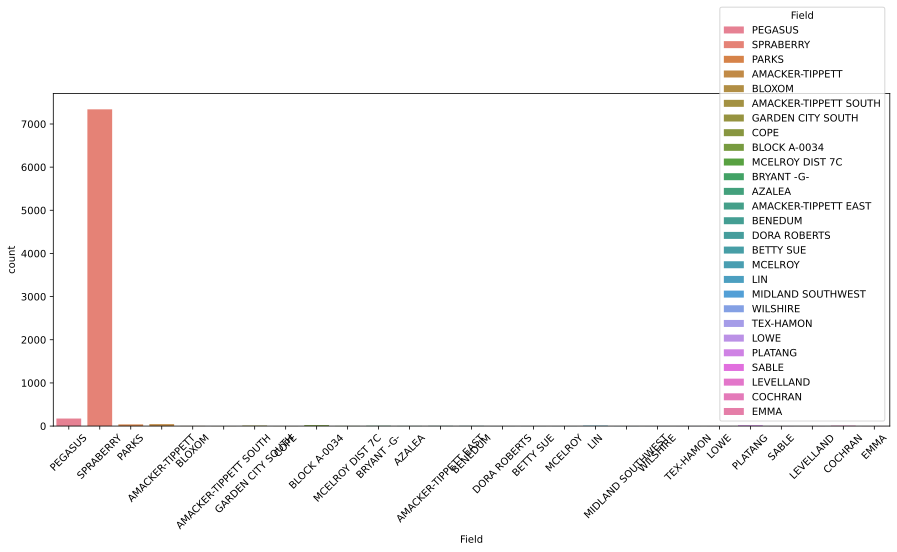

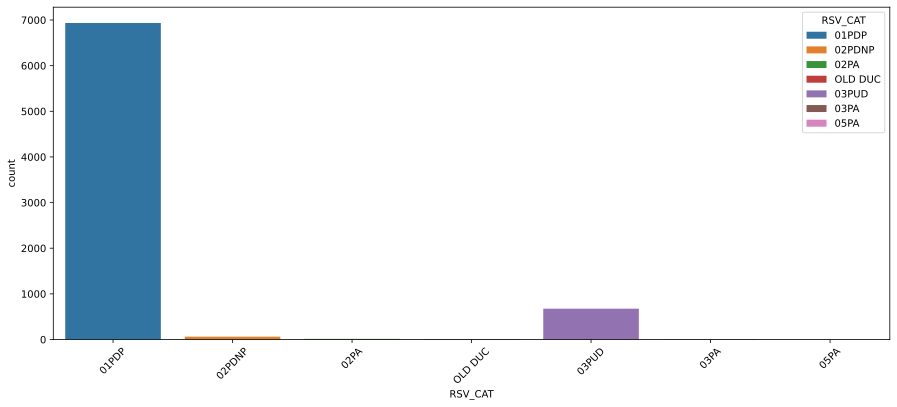

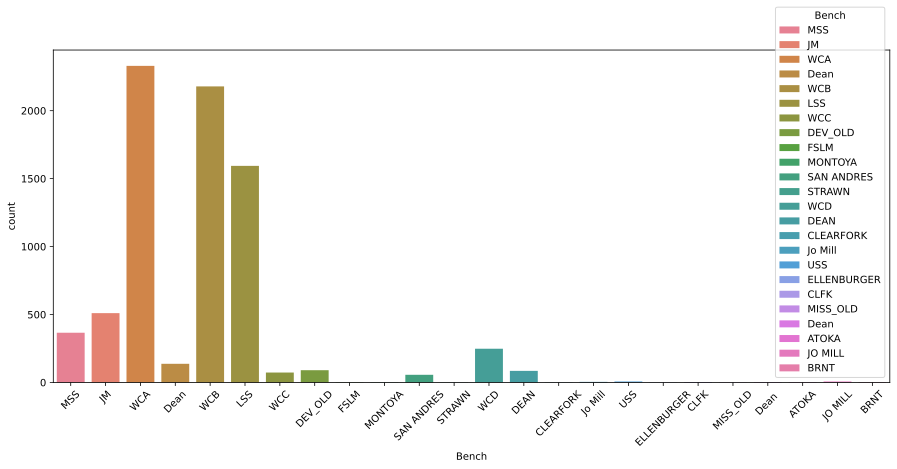

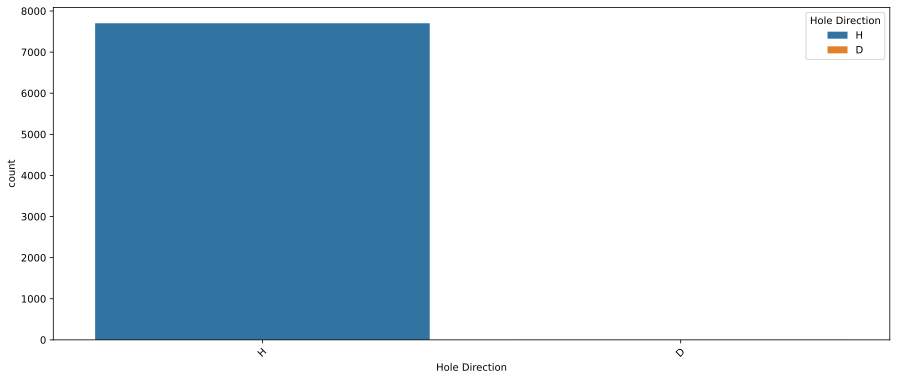

In [21]:
# Looping through all the features by our y variable - see if there is relationship
# object_cols = [col for col in df_raw.columns if df_raw[col].dtypes.name == 'object']

for f in ['Field','RSV_CAT','Bench','Hole Direction']:
    # Set the figure size
    plt.figure(figsize=(15, 6))
    
    sns.countplot(x = f, data = df_raw_merge, hue=f,legend=True)
    plt.xticks(rotation=45)

## 5. Feature Engineering

In [22]:
# Keeping only Relevant Reserve Catg
df_raw_filter_ResvCat = df_raw_merge[(df_raw_merge['RSV_CAT'].isin(['01PDP','02PA','02PDNP','03PUD']))].reset_index(drop=True).copy()

In [24]:
# Calculate the midpoints
df_raw_filter_ResvCat['mid_lat'] = (df_raw_filter_ResvCat['heel_lat'] + df_raw_filter_ResvCat['toe_lat']) / 2
df_raw_filter_ResvCat['mid_long'] = (df_raw_filter_ResvCat['heel_lon'] + df_raw_filter_ResvCat['toe_lon']) / 2

In [36]:
# Filterning NaN values
df_raw_filter_ResvCat = df_raw_filter_ResvCat[~(df_raw_filter_ResvCat['mid_lat'].isna() & df_raw_filter_ResvCat['mid_long'].isna())].reset_index(drop=True).copy()

<Axes: xlabel='mid_lat', ylabel='mid_long'>

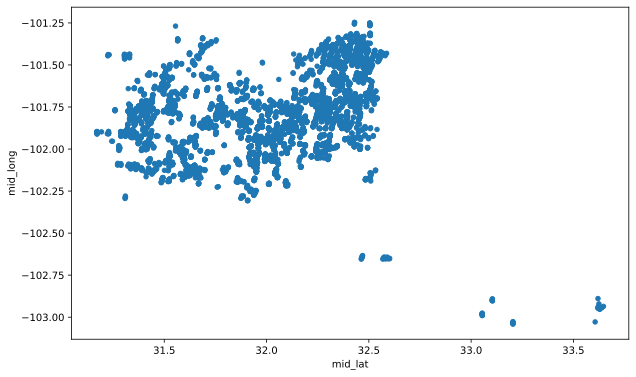

In [37]:
df_raw_filter_ResvCat.plot(kind='scatter',x='mid_lat',y='mid_long',figsize=(10,6))

## 6. DBSCAN

### 6.1 Defining Functions

In [42]:
def haversine_distance(lon1, lat1, lon2, lat2,**kwargs):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)
    All args must be of equal length.

    """
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km


def dbscan_cluster(latitudes,longitudes,epsilon,min_samples,**kwargs):
    '''
    Function to perform DBSCAN clustering for given parameters.
    
    '''
    
    # convert epsilon from km to radians
    kms_per_radian = 6371.0088
    epsilon /= kms_per_radian
    
    # set up the algorithm
    dbscan = DBSCAN(
        eps = epsilon,
        min_samples = min_samples,
        algorithm = 'ball_tree',
        metric = 'haversine',
        **kwargs
    )
    
    # fit the algorithm
    dbscan.fit(
        np.radians(
            [x for x in zip(latitudes,longitudes)]
        )
    )
    
    # return the cluster labels
    return pd.Series(dbscan.labels_)


def vertex_centroid_distance(latitudes,longitudes,**kwargs):
    '''
    Function to calculate the average distance from the vertices of a convex hull
    (derived from latitude x longitude pairs) to the centroid of said convex hull.
    
    Centroid is taken to be the unweighted average of all co-ordinate pairs.
    
    '''
    
    # co-ordinates of centre
    # take a simple average
    centre_long = longitudes.mean()
    centre_lats = latitudes.mean()
    
    # collapse two points into line
    if len(latitudes) < 3:
        distances = haversine_distance(
            longitudes,
            latitudes,
            centre_long,
            centre_lats,
            **kwargs).mean()
    
    else:
        # convex hull
        convex_hull = ConvexHull([x for x in zip(latitudes,longitudes)],**kwargs)

        # now get co-ordinates of vertices
        vertex_longs = longitudes.iloc[convex_hull.vertices]
        vertex_lats = latitudes.iloc[convex_hull.vertices]

        # now get
        distances = haversine_distance(
            vertex_longs,
            vertex_lats,
            centre_long,
            centre_lats,
            **kwargs).mean()

    # return average distance
    return distances.mean() if not np.isnan(distances) else 0.0


def calculate_average_values_in_disctionary(dictionary:dict):
    return -1*(sum(dictionary.values())/len(dictionary)) if dictionary else None


def black_box_function(epsilon, min_samples):
    """
    Function with unknown internals we wish to maximize.

    This is just serving as an example, for all intents and
    purposes think of the internals of this function, i.e.: the process
    which generates its output values, as unknown.

    DataFrame: Dataframe with Lat & Long
    """
    df = df_raw_filter_ResvCat[['mid_lat','mid_long']].copy()

    df.drop_duplicates(inplace=True)

    df['cluster'] = dbscan_cluster(latitudes=df['mid_lat'],longitudes=df['mid_long'],
                                   epsilon=epsilon,min_samples=int(min_samples))
    
    vertex_dist = {}

    for cluster in df['cluster'].unique():

        df_cluster_lat_longs = df[df['cluster']==cluster].loc[:,['mid_lat','mid_long']].copy()

        vertex_dist[cluster] = vertex_centroid_distance(latitudes=df_cluster_lat_longs['mid_lat'], longitudes=df_cluster_lat_longs['mid_long'])

    return calculate_average_values_in_disctionary(vertex_dist)


def plot_clusters(df:pd.DataFrame,eps:float,min_samp:int):

    df_result = df.copy()

    df_result['cluster'] = dbscan_cluster(latitudes=df_result['mid_lat'],longitudes=df_result['mid_long'],
                                epsilon=eps, min_samples=min_samp)
    

    m = folium.Map(location=[df_result['mid_lat'].mean(), df_result['mid_long'].mean()], 
                tiles="OpenStreetMap", zoom_start=11)
    
    # Create a colormap for the unique cluster labels
    cmap = plt.get_cmap('hsv', len(df_result['cluster'].unique()))

    # Create a color dictionary for each unique cluster
    colors = {cluster: matplotlib.colors.rgb2hex(cmap(i)) for i, cluster in enumerate(df_result['cluster'].unique())}

    # Add a circle marker for each point
    for _, row in df_result.iterrows():
        folium.CircleMarker(
            location=[row['mid_lat'], row['mid_long']],
            radius=5, # Defines the radius of the circle marker
            color="white",
            fill=True,
            popup = f"{row['Well Name']}, Cluster: {row['cluster']}",
            fill_color=colors[row['cluster']],
            fill_opacity=1
        ).add_to(m)


    # Return the map
    return m, df_result

### 6.2 Running Bayesian Optimization

In [39]:
# Bounded region of parameter space
pbounds = {'epsilon': (0.1, 0.2), 'min_samples': (1, 3)}

optimizer = BayesianOptimization(
    f=black_box_function,
    pbounds=pbounds,
    random_state=0,
    allow_duplicate_points=True
)

In [40]:
optimizer.maximize()

|   iter    |  target   |  epsilon  | min_sa... |
-------------------------------------------------
| 1         | -0.1956   | 0.1549    | 2.43      |
| 2         | -0.204    | 0.1603    | 2.09      |
| 3         | -0.1709   | 0.1424    | 2.292     |
| 4         | -0.174    | 0.1438    | 2.784     |
| 5         | -0.0777   | 0.1964    | 1.767     |
| 6         | -0.08218  | 0.2       | 1.683     |
| 7         | -0.01288  | 0.1       | 1.448     |
| 8         | -0.2386   | 0.1832    | 2.28      |
| 9         | -0.02672  | 0.1262    | 1.52      |
| 10        | -0.0139   | 0.1024    | 1.447     |
| 11        | -0.01288  | 0.1       | 1.234     |
| 12        | -0.01288  | 0.1       | 1.027     |
| 13        | -0.1155   | 0.1082    | 2.629     |
| 14        | -0.08185  | 0.1996    | 1.126     |
| 15        | -0.06538  | 0.1831    | 1.336     |
| 16        | -0.01312  | 0.1006    | 1.135     |
| 17        | -0.238    | 0.1       | 3.0       |
| 18        | -0.01288  | 0.1       | 1.708     |


### 6.3 Getting and Plotting Final DB Cluster

In [46]:
m, df_with_clusters = plot_clusters(df=df_raw_filter_ResvCat, eps=0.1964, min_samp=1)
m

In [ ]:
# df_with_clusters[['ChosenID','heel_lat','heel_lon','toe_lat','toe_lon','cluster']].to_csv("MB_Bundles.csv",index=False)

In [32]:
df_with_clusters.to_clipboard(sep=',',index=False)